In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd

from tqdm import tqdm
from scipy.special import erfc

from scipy.optimize import curve_fit
from scipy import stats

import cross_sections as xsect

import warnings
warnings.filterwarnings('ignore')

In [2]:
data = xsect.getXsections(
    url="https://clas.sinp.msu.ru/cgi-bin/jlab/db.cgi?beam=1&beam_pol=2&tgt=proton&tz=&ta=&target_pol=0&final=1&final_pol=0&q2min=0.5&q2max=4.5&wmin=1.0&wmax=3.0&xmin=&xmax=&ephmin=&ephmax=&quantity=19&authors=&year=&eid=&texttable=on&selected-fields=id&selected-fields=final&selected-fields=q2min&selected-fields=q2max&selected-fields=wmin&selected-fields=wmax&selected-fields=quantity&selected-fields=title&selected-fields=authors&selected-fields=year&limit=100&search=Start+search"
)

data.parseDataSets()


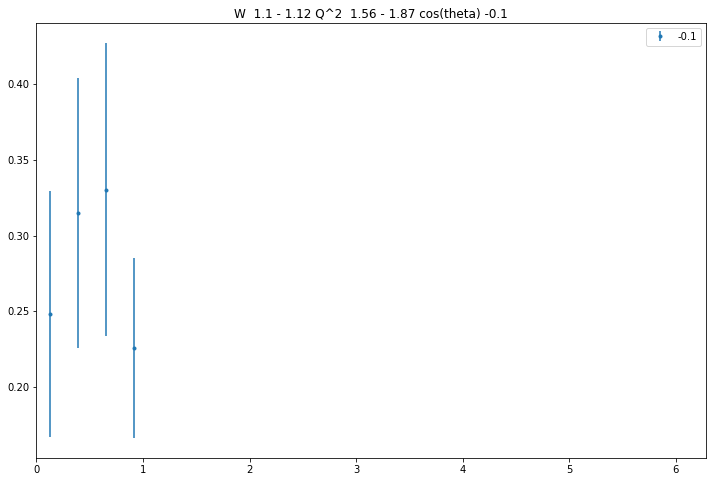

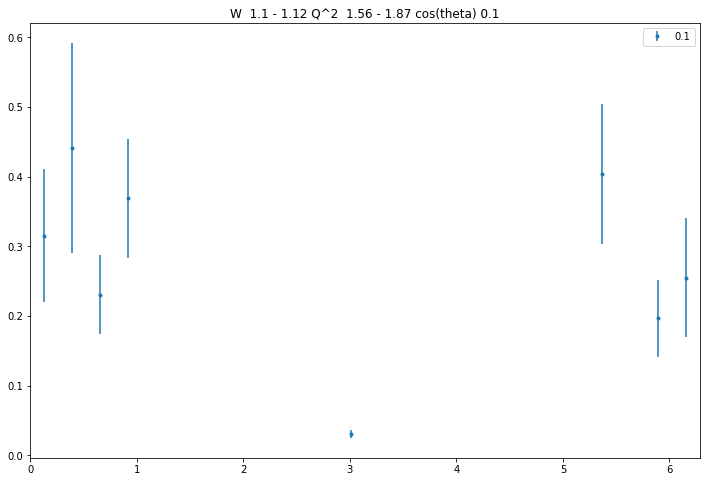

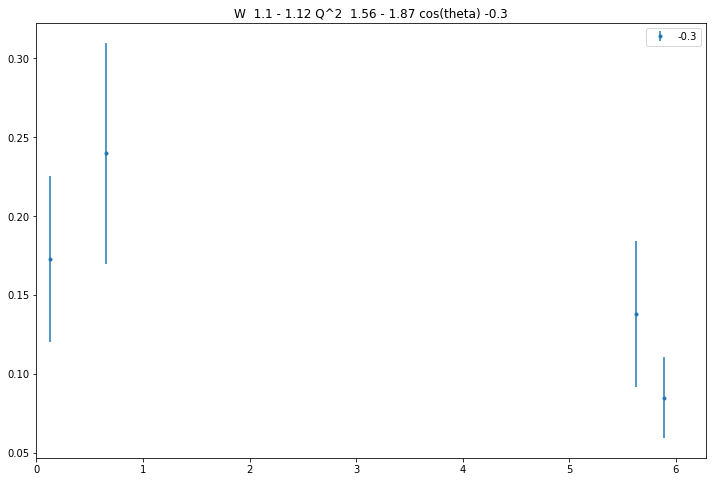

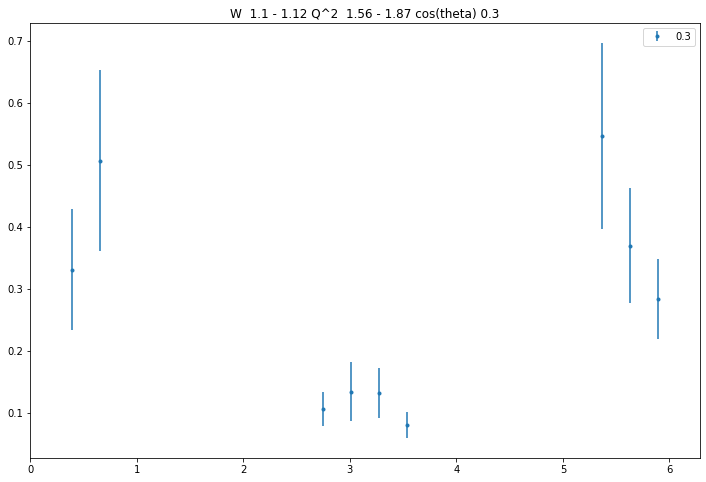

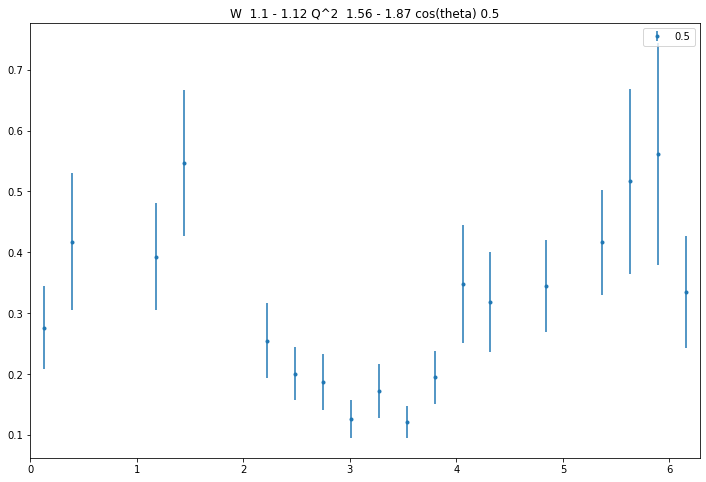

...

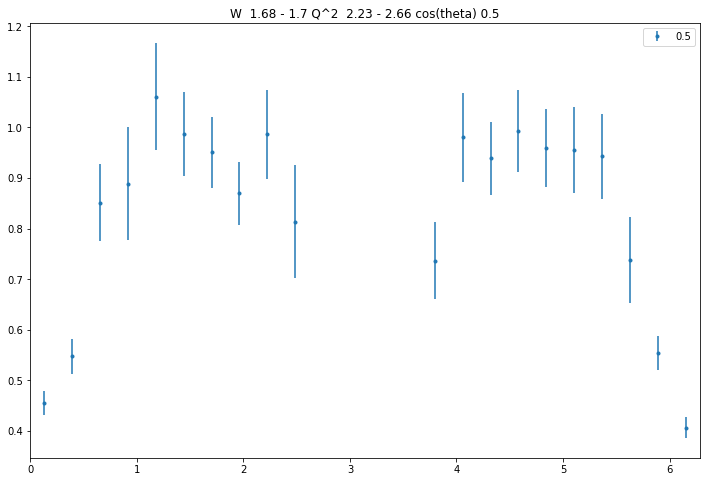

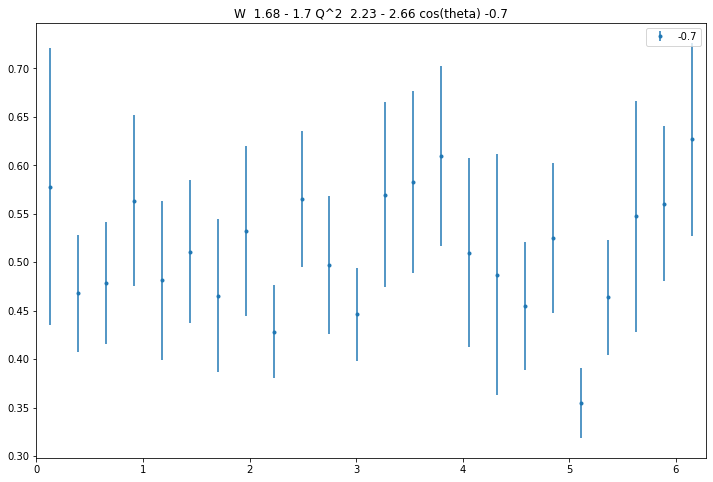

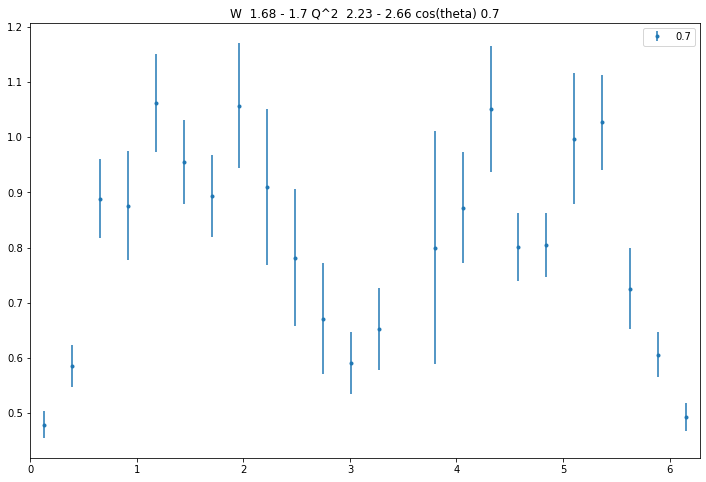

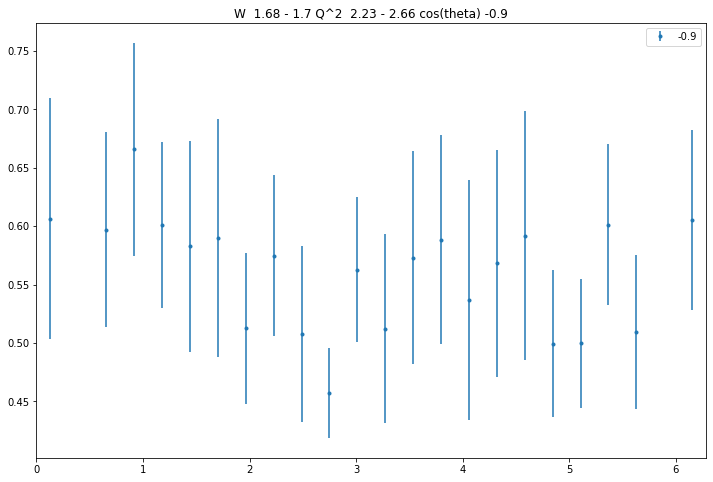

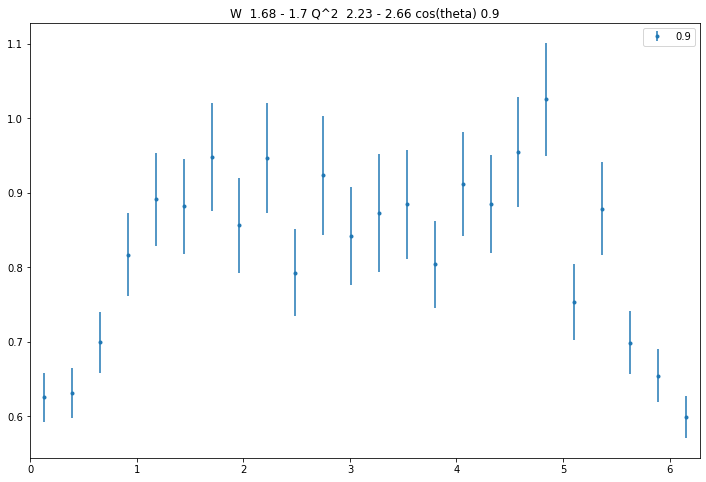

In [9]:
for sets in data.datasets:
    for cos_t in sets.dataFrame["cos(theta_pi)"].unique():
        fig, ax = plt.subplots(figsize=[12, 8])
        cut = sets.dataFrame["cos(theta_pi)"] == cos_t
        x = np.radians(sets.dataFrame[cut]["phi(pi+)"])
        y = sets.dataFrame[cut]["dsigma/dOmega"]
        yerr = sets.dataFrame[cut]["Data errors"]
        ax.set_title(f'W {sets.experiment["W range"]} Q^2 {sets.experiment["Q^2 range"]} cos(theta) {cos_t}')
        ax.errorbar(x, y, yerr=yerr, fmt=".", label=f'{cos_t}')
        ax.legend()
        ax.set_xlim(0,2*np.pi)
        plt.show()


In [4]:
sets.experiment

{'Measurement': 'E13M100',
 'Title': ' E99-107 CLAS experiment',
 'Spokespersons': ' V. D. Burkert, R. Minehart',
 'Year': ' 2005',
 'Q^2 range': ' 2.23 - 2.66',
 'Q2_min': 2.23,
 'Q2_max': 2.66,
 'W range': ' 1.68 - 1.7',
 'W_min': 1.68,
 'W_max': 1.7,
 'E_beam': 'is not available',
 'coloumnNamesWithUnits': ['epsilon [dimensionless]',
  'cos(theta_pi) [dimensionless]',
  'phi(pi+) [degree]',
  'dsigma/dOmega [mcb/sr]',
  'Data errors [mcb/sr]'],
 'coloumnNames': ['epsilon',
  'cos(theta_pi)',
  'phi(pi+)',
  'dsigma/dOmega',
  'Data errors']}